In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import sys

sys.path.append(os.path.expanduser("~/clef/plantclef-2025/"))

In [3]:
from plantclef.spark import get_spark

spark = get_spark()
display(spark)

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/03/02 13:01:52 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/03/02 13:01:52 WARN SparkConf: Note that spark.local.dir will be overridden by the value set by the cluster manager (via SPARK_LOCAL_DIRS in mesos/standalone/kubernetes and LOCAL_DIRS in YARN).


In [4]:
from pathlib import Path

home = Path.home()
knn_path = home / "scratch/plantclef/data/knn"
dataset = "test_2024"
k = 50
knn_df = spark.read.parquet(str(knn_path / dataset / f"k={k}"))

In [5]:
knn_df.printSchema()
knn_df.show(5)

root
 |-- image_name: string (nullable = true)
 |-- tile: integer (nullable = true)
 |-- cls_embedding: array (nullable = true)
 |    |-- element: float (containsNull = true)
 |-- distances: array (nullable = true)
 |    |-- element: float (containsNull = true)
 |-- nn_ids: array (nullable = true)
 |    |-- element: integer (containsNull = true)
 |-- grid: string (nullable = true)



+--------------------+----+--------------------+--------------------+--------------------+----+
|          image_name|tile|       cls_embedding|           distances|              nn_ids|grid|
+--------------------+----+--------------------+--------------------+--------------------+----+
|CBN-Pla-A1-201507...|  21|[0.21448913, 1.83...|[0.9790672, 1.075...|[1030958, 1232584...| 6x6|
|CBN-PdlC-D6-20190...|  24|[-0.19922814, 0.8...|[0.9749708, 1.007...|[1232584, 1030958...| 6x6|
|CBN-PdlC-C2-20140...|   8|[1.8081415, 1.974...|[1.0173109, 1.030...|[50293, 453007, 3...| 6x6|
|CBN-Pla-E3-202006...|  12|[-0.53749895, 0.4...|[1.1672064, 1.258...|[345384, 1397442,...| 6x6|
|CBN-Pla-A6-201407...|  23|[-0.61038494, 1.9...|[1.0214908, 1.056...|[490372, 445691, ...| 6x6|
+--------------------+----+--------------------+--------------------+--------------------+----+
only showing top 5 rows



In [6]:
id_map_path = home / "scratch/plantclef/data/faiss/train/train_id_map"
id_df = spark.read.parquet(str(id_map_path))
id_df.printSchema()
id_df.show(5)

root
 |-- id: integer (nullable = true)
 |-- image_name: string (nullable = true)
 |-- species_id: integer (nullable = true)

+---+--------------------+----------+
| id|          image_name|species_id|
+---+--------------------+----------+
|  0|3a2c58a78ee93b471...|   1363472|
|  1|0a0bf86d70307e8db...|   1361957|
|  2|7990901729be71186...|   1363472|
|  3|80257a4818f5955f9...|   1392612|
|  4|e13e476d0dc36ed7b...|   1360562|
+---+--------------------+----------+
only showing top 5 rows



In [7]:
train_data_folder = home / "scratch/plantclef/data/parquet/train"
train_data_df = spark.read.parquet(str(train_data_folder))
train_data_df.printSchema()
train_data_df.show(5)

root
 |-- image_name: string (nullable = true)
 |-- path: string (nullable = true)
 |-- data: binary (nullable = true)
 |-- organ: string (nullable = true)
 |-- species_id: integer (nullable = true)
 |-- obs_id: long (nullable = true)
 |-- license: string (nullable = true)
 |-- partner: string (nullable = true)
 |-- author: string (nullable = true)
 |-- altitude: double (nullable = true)
 |-- latitude: double (nullable = true)
 |-- longitude: double (nullable = true)
 |-- gbif_species_id: string (nullable = true)
 |-- species: string (nullable = true)
 |-- genus: string (nullable = true)
 |-- family: string (nullable = true)
 |-- dataset: string (nullable = true)
 |-- publisher: string (nullable = true)
 |-- references: string (nullable = true)
 |-- url: string (nullable = true)
 |-- learn_tag: string (nullable = true)
 |-- image_backup_url: string (nullable = true)



+--------------------+--------------------+--------------------+------+----------+----------+--------------------+-------+-----------------+--------+------------------+------------------+---------------+--------------------+----------------+--------------+--------+-----------+--------------------+--------------------+---------+--------------------+
|          image_name|                path|                data| organ|species_id|    obs_id|             license|partner|           author|altitude|          latitude|         longitude|gbif_species_id|             species|           genus|        family| dataset|  publisher|          references|                 url|learn_tag|    image_backup_url|
+--------------------+--------------------+--------------------+------+----------+----------+--------------------+-------+-----------------+--------+------------------+------------------+---------------+--------------------+----------------+--------------+--------+-----------+--------------------+

In [8]:
import matplotlib.pyplot as plt
import pandas as pd
from pyspark.sql.functions import broadcast, col

In [9]:
image_name = "CBN-Pyr-03-20230706.jpg"
grid_size = 4
top_k = 5

tiles_pd = knn_df.filter((knn_df.image_name == image_name) & (knn_df.grid == f"{grid_size}x{grid_size}")) \
    .drop("image_name", "cls_embedding", "grid") \
    .toPandas() \
    .sort_values(by="tile")
tiles_pd

,tile,distances,nn_ids
6,0,"[0.9219351, 0.95087254, 0.9674678, 0.97557044,...","[1152194, 305589, 577961, 796106, 424864, 8803..."
12,1,"[0.9451438, 1.0129848, 1.0277965, 1.049544, 1....","[63740, 1125525, 613310, 1342370, 1362412, 184..."
7,2,"[1.120759, 1.1460371, 1.1541631, 1.1741493, 1....","[524544, 1226184, 437598, 455579, 517351, 8414..."
15,3,"[0.7920208, 0.8471155, 0.8711324, 0.8912914, 0...","[1308193, 1347551, 1404989, 513555, 967370, 12..."
8,4,"[0.68914986, 0.86542463, 0.87394905, 0.8741140...","[12727, 544082, 426838, 1276853, 642773, 13532..."
13,5,"[0.7992537, 0.93938327, 0.9540684, 0.9983156, ...","[12727, 1276853, 1264283, 642773, 544082, 1392..."
4,6,"[0.88515043, 0.9709194, 1.0043658, 1.0096809, ...","[454917, 442642, 1336932, 612954, 869539, 1043..."
10,7,"[0.9594333, 1.0635457, 1.0720801, 1.0741619, 1...","[12727, 544082, 642773, 132845, 1276853, 12803..."
1,8,"[0.90439296, 1.0220343, 1.0561008, 1.0906126, ...","[12727, 454917, 300055, 1264283, 671632, 12803..."
2,9,"[0.581656, 0.7507403, 0.7645863, 0.77553785, 0...","[12727, 1392655, 1280315, 1276853, 91440, 6427..."


In [10]:
all_nn_ids = []
for nn_ids in tiles_pd['nn_ids']:
    all_nn_ids.extend(nn_ids[:top_k])
all_nn_ids = list(set(all_nn_ids))

In [11]:
species_id_mapping_df = (
    id_df
    .filter(col("id").isin(all_nn_ids))
    .select("id", "species_id", "image_name")
    .cache()
)

In [12]:
species_ids_df = species_id_mapping_df.select("species_id").distinct()
species_ids = species_ids_df.rdd.flatMap(lambda x: x).collect()
image_names = species_id_mapping_df.select("image_name").distinct().rdd.flatMap(lambda x: x).collect()

In [13]:
filtered_train_df = (
    train_data_df
    .filter(train_data_df.image_name.isin(image_names))
    .select("image_name", "data", "species")
    .cache()
)

In [14]:
id_to_info_df = (
    species_id_mapping_df
    .join(broadcast(filtered_train_df), "image_name", "inner")
    .select("id", "species_id", "data", "species")
)
id_to_info_pd = id_to_info_df.toPandas()

In [15]:
id_to_data = dict(zip(id_to_info_pd['id'], id_to_info_pd['data']))
id_to_species_id = dict(zip(id_to_info_pd['id'], id_to_info_pd['species_id']))
id_to_species = dict(zip(id_to_info_pd['id'], id_to_info_pd['species']))

In [16]:
species_id_mapping_df.unpersist()
filtered_train_df.unpersist()

DataFrame[image_name: string, data: binary, species: string]

In [20]:
from PIL import Image

def split_into_grid(image, grid_size):
    w, h = image.size
    grid_w, grid_h = w // grid_size, h // grid_size
    images = []
    for i in range(grid_size):
        for j in range(grid_size):
            left = i * grid_w
            upper = j * grid_h
            right = left + grid_w
            lower = upper + grid_h
            crop_image = image.crop((left, upper, right, lower))
            images.append(crop_image)
    return images

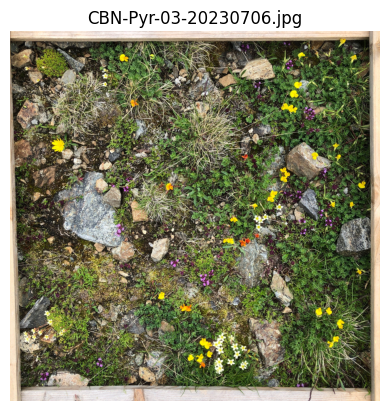

In [18]:
from plantclef.serde import deserialize_image

test_data_folder = home / "scratch/plantclef/data/parquet/test_2024"
test_data_df = spark.read.parquet(str(test_data_folder))

original_image_data = test_data_df.filter(test_data_df.image_name == image_name).select("data").collect()[0][0]
original_image = deserialize_image(original_image_data)

plt.imshow(original_image)
plt.title(image_name)
plt.axis('off')
plt.show()

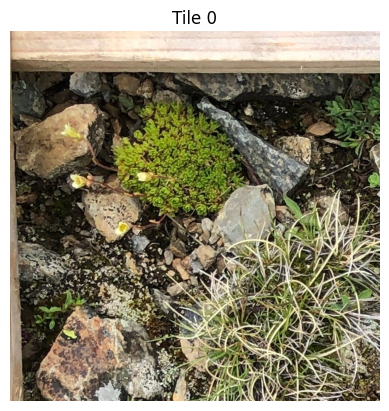

In [21]:
original_tiles = split_into_grid(original_image, grid_size)

plt.imshow(original_tiles[0])
plt.title("Tile 0")
plt.axis('off')
plt.show()

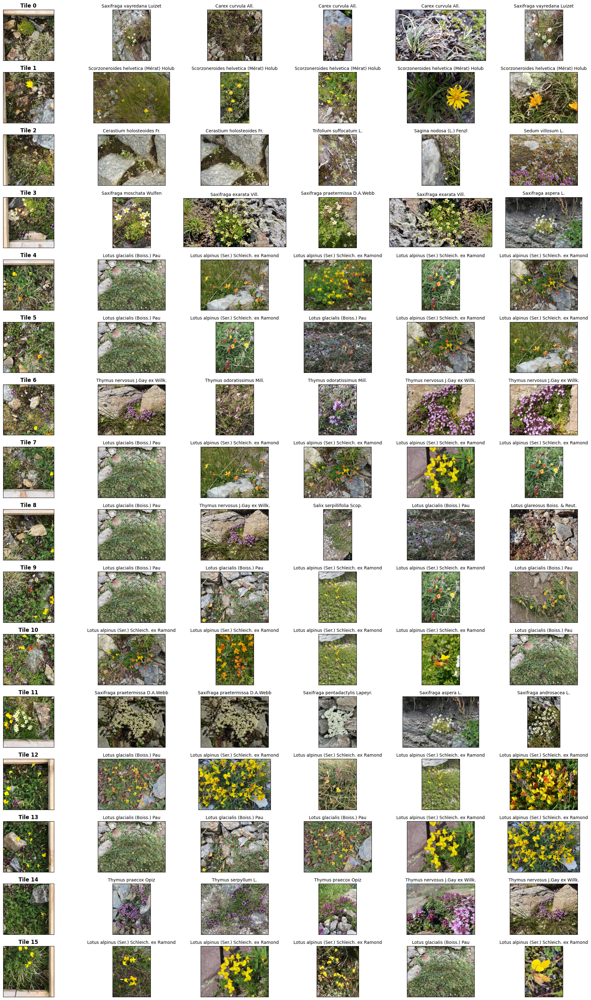

In [37]:
from textwrap import wrap

tile_nums = list(range(16))

fig, axes = plt.subplots(len(tile_nums), top_k + 1, figsize=((top_k + 1) * 3 + 2, len(tile_nums) * 2))

filtered_tiles_pd = tiles_pd[tiles_pd['tile'].isin(tile_nums)]

for i, (_, row) in enumerate(filtered_tiles_pd.iterrows()):
    tile_num = row['tile']
    tile_nn_ids = row['nn_ids'][:top_k]
    
    # show original tile
    axes[i, 0].imshow(original_tiles[tile_num])
    axes[i, 0].set_title(f"Tile {tile_num}", fontweight="bold")
    axes[i, 0].set_xticks([])
    axes[i, 0].set_yticks([])
    
    # show nearest neighbors
    for j, nn_id in enumerate(tile_nn_ids):
        image = deserialize_image(id_to_data.get(nn_id))
        species = id_to_species.get(nn_id, "Unknown")

        axes[i, j+1].imshow(image)
        axes[i, j+1].set_title("\n".join(wrap(species, 40)), fontsize="10")
        
        axes[i, j+1].set_xticks([])
        axes[i, j+1].set_yticks([])

plt.tight_layout()
plt.show()